## ■ 시그모이드 함수를 도함수로 표현해보기(오차역전파)

## 문제47. 시그모이드(sigmoid) 클래스를 p170을 보고 생성하고 객체화 시킨 후 foward 와 backward를 실행하시오.

In [1]:
class Sigmoid:
    def __init__(self):
        self.out = None
    
    def forward(self,x):
        out = 1 / (1+ np.exp(-x))
        self.out = out
        
        return out
    
    def backward(self, dout):
        dx = dout * (1.0 - self.out) * self.out
        
        return dx
    

import numpy as np

sigmoid1 = Sigmoid()
x = np.array([[1.0, -0.5], [-2.0, 3.0]])

print(sigmoid1.forward(x))
print(sigmoid1.backward(1)) # backward 실행전에 꼭 forward를 먼저 실행해야 됨.

[[0.73105858 0.37754067]
 [0.11920292 0.95257413]]
[[0.19661193 0.23500371]
 [0.10499359 0.04517666]]


### ※ 설명   
### forward를 먼저 실행해야 backward를 실행할 수 있다.  
### sigmoid 클래스 내의 out 변수(y)에 값이 담겨져야 하기 때문.

## 문제48. (점심시간문제) 아래의 y의 도함수를 구하시오!

## ■4. 단순한 계층 구현하기 (p.160) 그림5-16

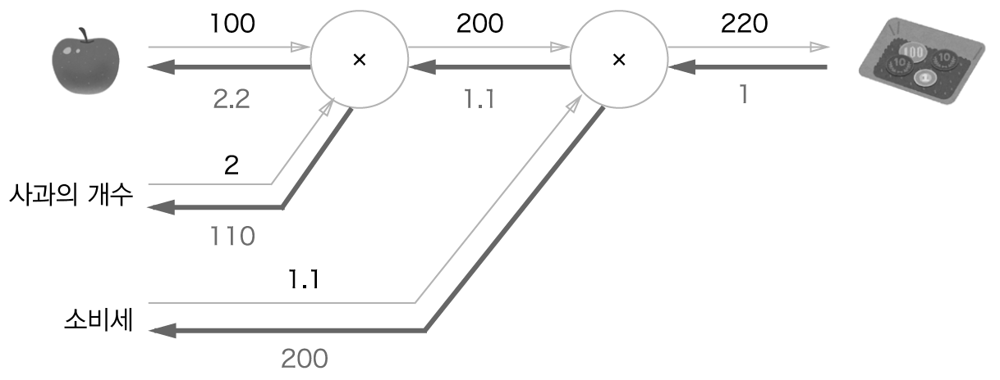

## 예제1. 위의 그림을 구현하기 위해서 책 161페이지의 MulLayer 클래스를 구현하시오.

In [2]:
class mulLayer():
    def __init__(self):
        self.x = None
        self.y = None
    
    def forward(self, x, y):
        self.x = x
        self.y = y
        out = x*y
        
        return out
    
    def backward(self,dout):
        dx = dout * self.y
        dy = dout * self.x
        
        return dx, dy

## 문제49. 위에서 만든 곱셈 클래스를 객체화 시켜서 아래의 사과 가격의 총 가격을 구하시오.

In [42]:
class MulLayer():
    def __init__(self):
        self.x = None
        self.y = None
    
    def forward(self, x, y):
        self.x = x
        self.y = y
        out = x*y
        
        return out
    
    def backward(self,dout):
        dx = dout * self.y
        dy = dout * self.x
        
        return dx, dy


apple = 100
apple_num = 2
tax = 1.1


# 순전파
mul_apple_layer = MulLayer()
mul_tax_layer = MulLayer()

apple_price = mul_apple_layer.forward(apple, apple_num)
price = mul_tax_layer.forward(apple_price,tax)

print(price)

220.00000000000003


## 문제50. dout을 1로 두고 역전파를 구현하시오!

In [41]:
class MulLayer():
    def __init__(self):
        self.x = None
        self.y = None
    
    def forward(self, x, y):
        self.x = x
        self.y = y
        out = x*y
        
        return out
    
    def backward(self,dout):
        dx = dout * self.y
        dy = dout * self.x
        
        return dx, dy

apple = 100
apple_num = 2
tax = 1.1


# 순전파
mul_apple_layer = MulLayer()
mul_tax_layer = MulLayer()

apple_price = mul_apple_layer.forward(apple, apple_num)
price = mul_tax_layer.forward(apple_price,tax)

print(price)

# 역전파

dout = 1

dapple_price, dtax = mul_tax_layer.backward(dout)
dapple, dapple_num = mul_apple_layer.backward(dapple_price)

print(dapple, dapple_num, dtax)

220.00000000000003
2.2 110.00000000000001 200


## 예제2. 책 163페이지의 addLayer(덧셈층) 클래스를 생성하시오!

In [ ]:
class AddLayer:
    def __init__(self):
        pass
    
    def forward(self,x,y):
        out = x + y
        return out
    
    def backward(self,dout):
        dx = dout * 1
        dy = dout * 1
        
        return dx, dy

## 문제51. 위에서 만든 곱셈 클래스와 덧셈 클래스를 이용하여 아래의 신경망을 구현하시오.
## (그림 5-17)

In [40]:
class MulLayer:
    def  __init__(self):
        self.x = None
        self.y = None
    def  forward(self, x, y):
        self.x = x
        self.y = y
        out = x * y
        return  out
    def backward(self, dout):
        dx = dout * self.y   # x 와 y 를 바꾼다. 
        dy = dout * self.x 
        
        return  dx, dy
    


class  AddLayer:
    def  __init__(self):
        pass

    def forward( self, x, y):
        out = x + y
        return  out

    def  backward( self, dout):
        dx = dout * 1
        dy = dout * 1
        return  dx, dy
    
apple = 100
apple_num = 2
orange = 150
orange_num = 3
tax = 1.1
    
    
# 계층들 
mul_apple_layer = MulLayer()
mul_orange_layer = MulLayer()
add_apple_orange_layer = AddLayer()
mul_tax_layer = MulLayer()    
    
# 순전파
apple_price = mul_apple_layer.forward(apple, apple_num)
orange_price = mul_orange_layer.forward(orange, orange_num)
all_price = add_apple_orange_layer.forward(apple_price, orange_price)

price = mul_tax_layer.forward(all_price, tax)

print(price)

715.0000000000001


## 문제52. dout을 1로 해서 그림5-17의 역전파를 출력하시오.

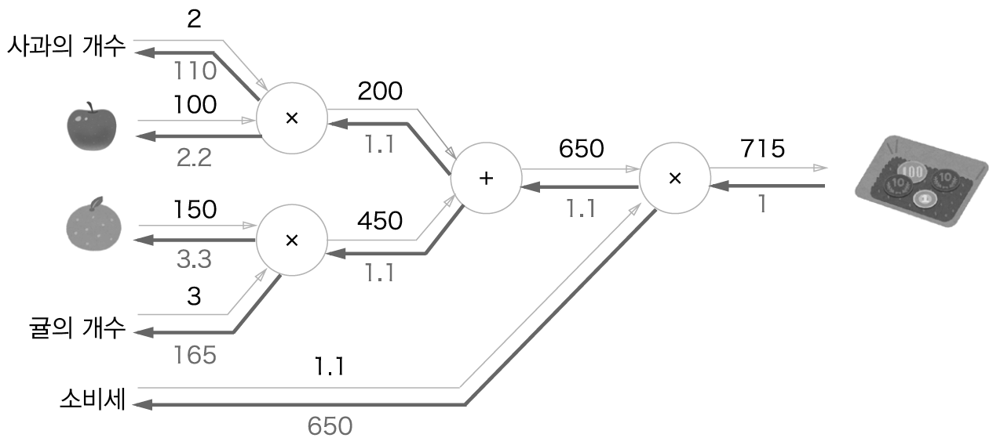

In [43]:
class MulLayer:
    def  __init__(self):
        self.x = None
        self.y = None
        
    def  forward(self, x, y):
        self.x = x
        self.y = y
        out = x * y
        
        return  out
    
    def backward(self, dout):
        dx = dout * self.y   # x 와 y 를 바꾼다. 
        dy = dout * self.x 
        
        return  dx, dy
    


class  AddLayer:
    def  __init__(self):
        pass

    def forward( self, x, y):
        out = x + y 
        return  out

    def  backward( self, dout):
        dx = dout * 1
        dy = dout * 1
        return  dx, dy


apple= 100
apple_num = 2
orange = 150
orange_num = 3
tax = 1.1 

#답:
# 계층들
mul_apple_layer= MulLayer()
mul_orange_layer = MulLayer()
add_apple_orange_layer = AddLayer()
mul_tax_layer = MulLayer()

# 순전파 
apple_price = mul_apple_layer.forward( apple, apple_num)
orange_price = mul_orange_layer.forward( orange, orange_num)
all_price = add_apple_orange_layer.forward( apple_price, orange_price )
price = mul_tax_layer.forward( all_price, tax )

dout = 1
dall_price,  dtax = mul_tax_layer.backward(dout)
dapple_price, dorange_price = add_apple_orange_layer.backward(dall_price)
dorange, dorange_num = mul_orange_layer.backward( dorange_price)
dapple, dapple_num = mul_apple_layer.backward( dapple_price ) 

print (price)  # 순전파를 먼저 실행한다. 
print (dapple_num, dapple, dorange, dorange_num, dtax )

715.0000000000001
110.00000000000001 2.2 3.3000000000000003 165.0 650


## ■ 5.활성화 함수 계층 구현하기

### 1. Relu 계층

__" 0보다 큰 값이 입력이 되면 그 값을 그대로 출력하고 0이거나 0보다 작은값이 입력이 되면 0을 출력하는 함수 "__

    - 순전파 함수
    - 역전파 함수

### ※ 파이썬으로 relu 함수를 구현하기 위해서 알아야하는 파이썬 문법 2가지

    1. copy 모듈 사용법?
    2. x[x<=0]

## 예제1. copy 모듈 사용법

In [45]:
a = [1, 2, 3]
b = a
print(b) # [1,2,3]

a[1] = 6

print(a) #[1,6,3]
print(b) #[1,6,3] # 같은 메모리의 내용을 보기 때문이다.(즉, 따로 쓰여지지 않는다.)

[1, 2, 3]
[1, 6, 3]
[1, 6, 3]


In [48]:
# copy 모듈을 사용해보면

from copy import copy

a = [1,2,3]
b = copy(a) # copy를 했기 때문에 b는 별도의 객체이다.
print(b)

a[1] = 6

print(a) # [1,6,3]
print(b) # [1,2,3]

[1, 2, 3]
[1, 6, 3]
[1, 2, 3]


## 예제2. x[x<=0]의 의미?

In [53]:
import numpy as np

x = np.array([[1.0, -0.5], [-2.0, 3.0]])
print(x)

mask = (x<=0)
print(mask)

out = x.copy()
out[mask] = 0 # True인 요소들은 전부다 0으로 바꾼다.
print(out)

[[ 1.  -0.5]
 [-2.   3. ]]
[[False  True]
 [ True False]]
[[1. 0.]
 [0. 3.]]


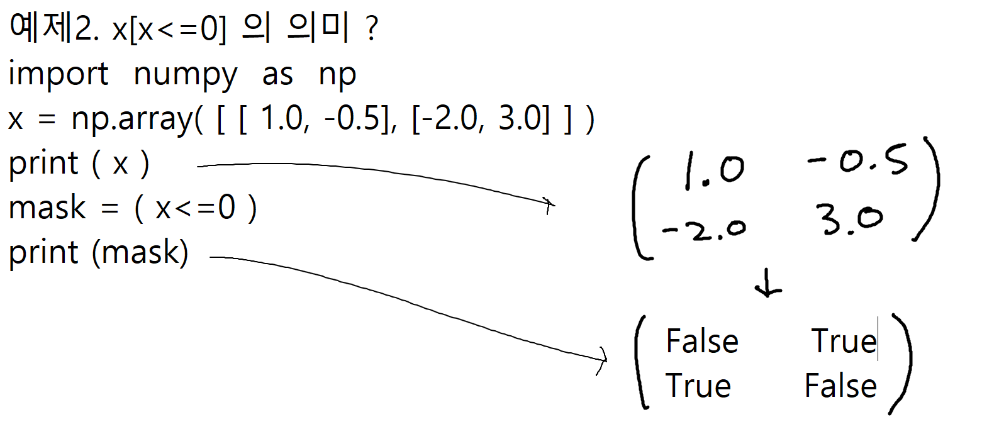

## 예제3. 책 166페이지의 Relu 클래스를 생성하시오!

In [54]:
class Relu:
    def __init__(self):
        self.mask = None
    
    def forward(self,x):
        self.mask = (x <=0) 
        out = x.copy()
        out[self.mask] = 0
        
        return out
    
    def backward(self, dout):
        dout[self.mask] = 0
        dx = dout
        
        return dx

# 순전파에서 썻던 mask를 역전파할 때 그대로 사용해서 
# 순전파일 때 입력값이 0이하 이면 역전파 일때 값을 0으로 역전파하고 있다.

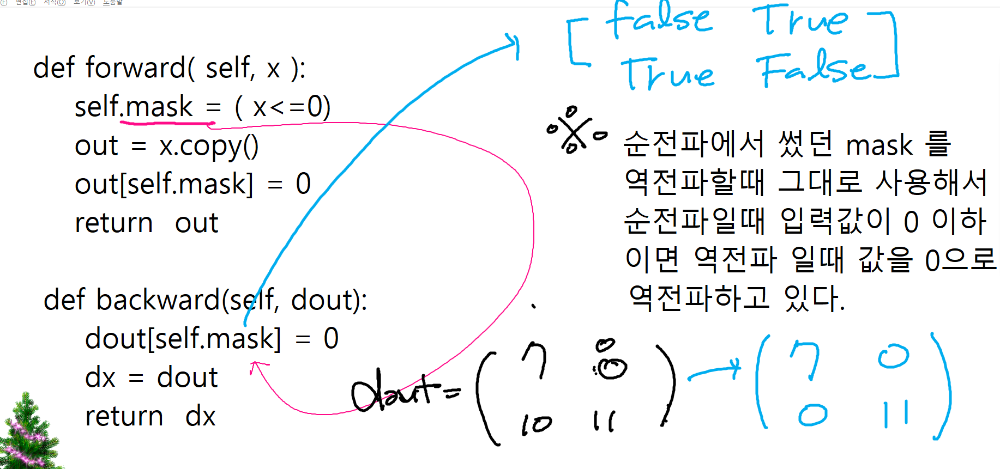

In [ ]:
class Relu:
    def __init__(self):
        self.mask = None
    
    def forward(self,x):
        self.mask = (x <= 0)
        out = x.copy()
        out[self.mask] = 0
        
        return out
    
    def backward(self,dout):
        dout[self.mask] = 0
        dx = dout
        
        return dx

x = np.array([[1.0, -0.5], [-2.0, 3.0]])
relu = Relu()
print(relu.forward(x))

dout = np.array([[2.0, 3.0], [-3.0,-4.0]])
print(relu.backward(dout))

## ■ sigmoid 계층

### 시그모이드 함수의 도함수?

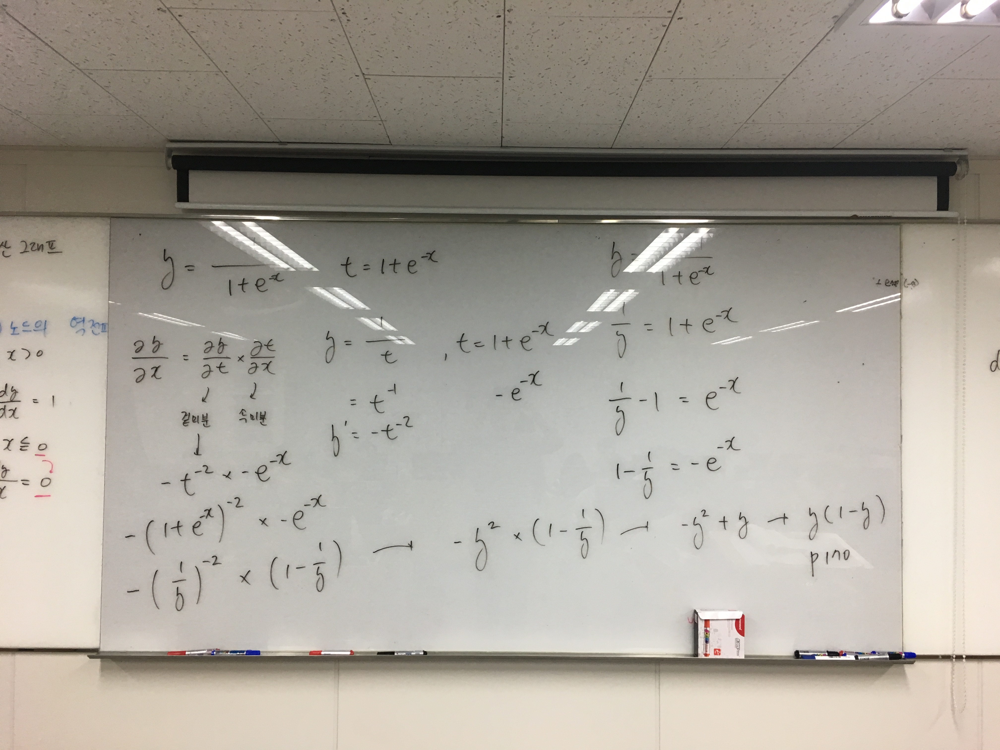

## 오늘의 마지막문제 : Knn 알고리즘을 파이썬으로 구현하시오!(내일까지)

__" 토미토와 가장 가까운 클래스는 무엇인가? "__

### ■ 수학 스터디 6번째 자료에 답글로 검사받음.